In [1]:
## imports 
import pandas as pd
import numpy as np
from wrangle import *
from model import *
import matplotlib.pyplot as plt
import datetime as dt
import time
import os

# modeling methods

alpha=0.05 #alpha for stats


import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [2]:

prepped=prep_zillow_2017()


prepped


our sql grab:
 (52442, 15)
after ensuring dates sql grab:
 (52441, 17)
df.transactiondate.min():
2017-01-01 00:00:00

df.transactiondate.max():
2017-09-25 00:00:00
Number of observations removed: 9546
Number of observations removed: 2830
Number of observations removed: 903
This is our percent change after removing all the outliers and merging :
 -25.2%
mean kurt:
0.44477474681080953
final shape:
(39227, 27)


None

,parcelid
county,
LA,61.80%
Orange,28.67%
Ventura,8.86%


6037.0    33911
6059.0    14136
6111.0     4395
Name: fips, dtype: int64

,taxvaluedollarcnt,bathroomcnt,bedroomcnt,area,fips,yearbuilt,lotsizesquarefeet,decade,latitude,longitude,...,transactiondate_in_days,transactiondate,lotsize/area,latscaled,longscaled,latlongPythagC,county,Geogroups,age,agebydecade
0,145143.0,3.0,4.0,2376.0,6037,1970.0,13038.0,1970,34245180.0,-118240722.0,...,1,2017-01-01,5.487374,34.245180,34.245180,48.429998,LA,21,47.0,47
1,218552.0,1.0,2.0,738.0,6037,1922.0,4214.0,1920,34149214.0,-118239357.0,...,1,2017-01-01,5.710027,34.149214,34.149214,48.294282,LA,17,95.0,97
2,273745.0,1.0,2.0,1146.0,6037,1939.0,4657.0,1930,34024040.0,-118159090.0,...,2,2017-01-02,4.063700,34.024040,34.024040,48.117259,LA,13,78.0,87
3,432754.0,1.0,3.0,1641.0,6037,1944.0,5302.0,1940,33760954.0,-118123592.0,...,2,2017-01-02,3.230957,33.760954,33.760954,47.745199,LA,4,73.0,77
4,401399.0,2.0,3.0,1538.0,6037,1972.0,5997.0,1970,34375142.0,-118559779.0,...,2,2017-01-02,3.899220,34.375142,34.375142,48.613792,LA,23,45.0,47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39222,648242.0,3.0,4.0,2983.0,6111,2002.0,4071.0,2000,34275011.0,-118804622.0,...,257,2017-09-14,1.364733,34.275011,34.275011,48.472185,Ventura,22,15.0,17
39223,519322.0,3.0,4.0,3187.0,6111,1987.0,8697.0,1980,34251757.0,-118774094.0,...,257,2017-09-14,2.728899,34.251757,34.251757,48.439299,Ventura,21,30.0,37
39224,105544.0,2.5,3.0,2652.0,6111,1959.0,8680.0,1950,34212151.0,-119181514.0,...,257,2017-09-14,3.273002,34.212151,34.212151,48.383288,Ventura,20,58.0,67
39225,309984.0,2.0,4.0,2031.0,6111,1976.0,7063.0,1970,34192104.0,-119213432.0,...,257,2017-09-14,3.477597,34.192104,34.192104,48.354937,Ventura,19,41.0,47


In [3]:
prepped.isnull().sum().sort_values()


taxvaluedollarcnt          0
Geogroups                  0
county                     0
latlongPythagC             0
longscaled                 0
latscaled                  0
lotsize/area               0
transactiondate            0
transactiondate_in_days    0
transaction_month_int      0
transaction_month          0
longitude                  0
latitude                   0
decade                     0
lotsizesquarefeet          0
yearbuilt                  0
fips                       0
area                       0
bedroomcnt                 0
bathroomcnt                0
age                        0
agebydecade                0
dtype: int64

In [4]:
a=pd.DataFrame(prepped.dtypes,columns=['dtype'])
b=pd.DataFrame(prepped.nunique(),columns=['nunique'])
c=pd.DataFrame(prepped.count(),columns=['count'])

d=pd.concat([a,b],axis=1)
e=pd.concat([d,c],axis=1)
e.sort_values(by='nunique',inplace=True)
print(e.to_markdown())

|                         | dtype          |   nunique |   count |
|:------------------------|:---------------|----------:|--------:|
| county                  | object         |         3 |   39227 |
| fips                    | int64          |         3 |   39227 |
| bedroomcnt              | float64        |         4 |   39227 |
| bathroomcnt             | float64        |         7 |   39227 |
| transaction_month       | object         |         9 |   39227 |
| transaction_month_int   | int64          |         9 |   39227 |
| decade                  | int64          |        11 |   39227 |
| agebydecade             | int64          |        11 |   39227 |
| Geogroups               | int64          |        25 |   39227 |
| age                     | float64        |        98 |   39227 |
| yearbuilt               | float64        |        98 |   39227 |
| transactiondate_in_days | int64          |       251 |   39227 |
| transactiondate         | datetime64[ns] |       251 |   392

In [5]:
prepped.columns.tolist()


['taxvaluedollarcnt',
 'bathroomcnt',
 'bedroomcnt',
 'area',
 'fips',
 'yearbuilt',
 'lotsizesquarefeet',
 'decade',
 'latitude',
 'longitude',
 'transaction_month',
 'transaction_month_int',
 'transactiondate_in_days',
 'transactiondate',
 'lotsize/area',
 'latscaled',
 'longscaled',
 'latlongPythagC',
 'county',
 'Geogroups',
 'age',
 'agebydecade']

 In the prepare step we needed to deal with some outliers. 
 In order to preserve the integrity of the data we seperated by the county, delt with outliers respective to each county then merged the data back together.

|                   | dtype   |   nunique |   count |
|:------------------|:--------|----------:|--------:|
| fips              | int64   |         3 |   39227 |
| county            | object  |         3 |   39227 |
| bedroomcnt        | float64 |         4 |   39227 |
| bathroomcnt       | float64 |         7 |   39227 |
| transaction_month | object  |         9 |   39227 |
| agebydecade       | int64   |        11 |   39227 |
| Geogroups         | int64   |        25 |   39227 |
| yearbuilt         | float64 |        98 |   39227 |
| area              | float64 |      2884 |   39227 |
| lotsizesquarefeet | float64 |      8715 |   39227 |
| taxvaluedollarcnt | float64 |     29096 |   39227 |
| latitude          | float64 |     37866 |   39227 |
| longitude         | float64 |     38049 |   39227 |
| logerror          | float64 |     38875 |   39227 |

In [6]:




fulllist,fullscalledlist,lalist,lascaled,oclist,ocscalledlist,venturalist,venturascalledlist=single_split_many_return(prepped)
## Non scaled
X_train=fulllist[0]
y_train=fulllist[1]
X_validate=fulllist[2]
y_validate=fulllist[3]
X_test =fulllist[4]
y_test=fulllist[5]
train =fulllist[6]

X_la_train=lalist[0]
y_la_train=lalist[1]
X_la_validate=lalist[2] 
y_la_validate=lalist[3] 
X_la_test=lalist[4] 
y_la_test=lalist[5]
train_la=lalist[6] 

X_orange_train=oclist[0] 
y_orange_train=oclist[1] 
X_orange_validate=oclist[2] 
y_orange_validate=oclist[3] 
X_orange_test=oclist[4] 
y_orange_test=oclist[5] 
orange_train=oclist[6]

## Scaled



X_scaled_train=fullscalledlist[0]
y_scaled_train=fullscalledlist[1]
X_scaled_validate=fullscalledlist[2]
y_scaled_validate=fullscalledlist[3]
X_scaled_test =fullscalledlist[4]
y_scaled_test=fullscalledlist[5]


X_scaled_la_train=lascaled[0]
y_scaled_la_train=lascaled[1]
X_scaled_la_validate=lascaled[2] 
y_scaled_la_validate=lascaled[3] 
X_scaled_la_test=lascaled[4] 
y_scaled_la_test=lascaled[5]


X_scaled_orange_train=ocscalledlist[0] 
y_scaled_orange_train=ocscalledlist[1] 
X_scaled_orange_validate=ocscalledlist[2] 
y_scaled_orange_validate=ocscalledlist[3] 
X_scaled_orange_test=ocscalledlist[4] 
y_scaled_orange_test=ocscalledlist[5] 




Note: The Train, Validate, Test split happens only once. This is in order to maintain data integrity.


In [7]:
h,w,aspect,h_int=goldenvisvars(m=1.75) 
#For viz purposes only

# Questions:

I'm intrested in seeing if location is significant to consider in this data. The specific questions we ask aboout this are asked in line. Since we have geographical data I have ploted mapboxes to visulize the datapoints respective to their locations.

In [8]:

fig = px.scatter_mapbox(train_la, lat=train_la.latitude/1e6, lon=train_la.longitude/1e6,center={'lat':34.0412,'lon':-118.251},hover_data=['yearbuilt','county'],color='transaction_month', zoom=8.25 ,height=h*1e2,width=w*1e2,size_max=1,opacity=.45)
fig.update_layout(mapbox_style='carto-darkmatter',title="Transactions by Month in (LA) 2017")
fig.show()

fig = px.scatter_mapbox(orange_train, lat=orange_train.latitude/1e6, lon=orange_train.longitude/1e6,center={'lat':33.76267,'lon':-117.8781},hover_data=['yearbuilt','county'],color='transaction_month', zoom=9, height=h*1e2,width=w*1e2,size_max=1,opacity=.45)
fig.update_layout(mapbox_style='carto-darkmatter',title="Transactions by Month in (OC) 2017")
fig.show()




### 1. We want to know if there are significant differences in the property values between LA and Orange. Lets findout:
 
 
 

 
$ H_0 $ : The average property value in LA is the same as in Orange
 
Verify Assumptions
 
Independent Samples (n.a. for 1-sample t-test). YES! no observations in the LA sample exist in the Orange.
Normal Distribution, or at least 30 observations and "kinda" normal. The more observations you have, the less "normal" it needs to appear. (CLT). YES! Plenty of observations
Equal Variances: They are not equal so we will account for that.
 



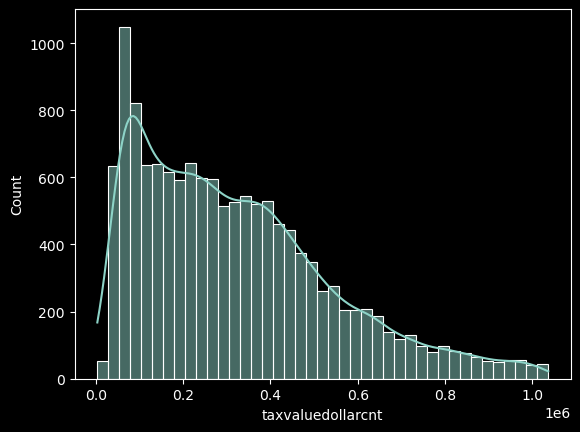

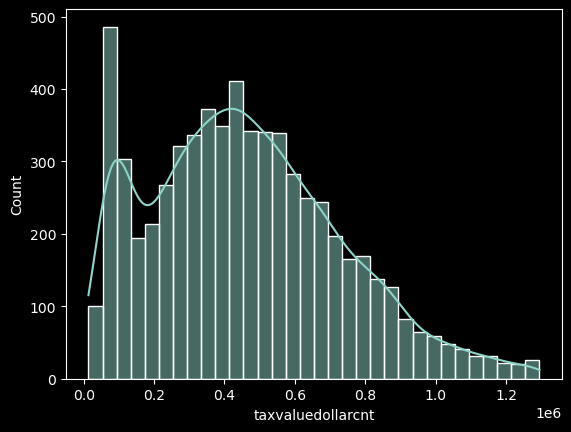

varsdiff:
2.4e+10


Reject~H_{0}~?

True

In [9]:
sns.histplot(data=train_la,x='taxvaluedollarcnt',kde=True)
plt.show()
sns.histplot(data=orange_train,x='taxvaluedollarcnt',kde=True)
plt.show()





varLA=train_la.taxvaluedollarcnt.var()



varOrange=orange_train.taxvaluedollarcnt.var()
varsdiff=abs(varOrange-varLA)
print(f'varsdiff:\n{varsdiff:.2g}')
t,p = stats.ttest_ind(train_la.taxvaluedollarcnt, orange_train.taxvaluedollarcnt,equal_var=False)
rejnull=symbols('Reject~H_{0}~?')
display(rejnull, p < alpha)


# train.columns

Since we can reject our null hypthesis we can say that the data varies significatly by location



## 2. Do the top three most profitable transaction months have significant differences?

$ H_0 $ : The top three most profitable transaction months have the same mean.

Verify Assumptions

Independent Samples (n.a. for 1-sample t-test). YES! no observations These are three separate months.
Normal Distribution, or at least 30 observations and "kinda" normal. The more observations you have, the less "normal" it needs to appear. (CLT). YES! Plenty of observations
Equal Variances: They are not equal so we will account for that.





,taxvaluedollarcnt
transaction_month,
August,5.94e+10
June,6.22e+10
May,5.97e+10


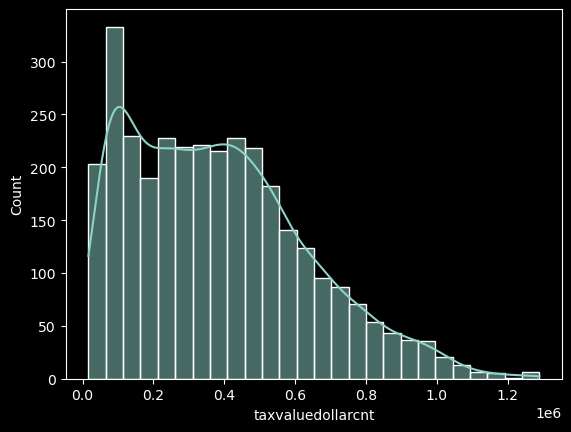

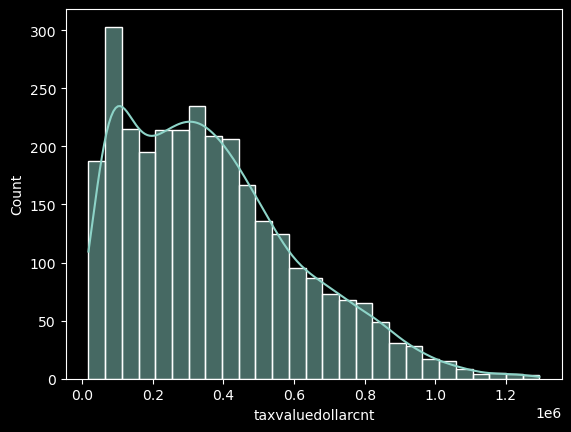

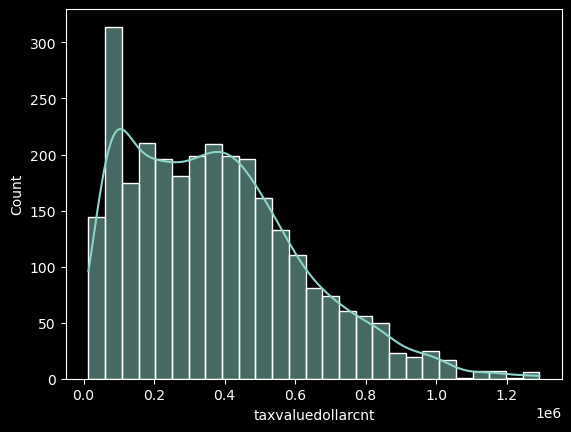

Reject~H_{0}~?

False

In [10]:

topthreesalesvalue=train[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).sum().nlargest(columns='taxvaluedollarcnt',n=3,keep='all').index.to_list()

topthreesalescount=train[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).count().nlargest(columns='taxvaluedollarcnt',n=3,keep='all').index.to_list()

topthreesalesvaluedf=train[(train.transaction_month==topthreesalesvalue[0]) | (train.transaction_month==topthreesalesvalue[1]) | (train.transaction_month==topthreesalesvalue[2]) ]
display(topthreesalesvaluedf[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).var().style.format(lambda x:f'{x:.3}').set_caption(caption="Variances:\n Top 3 months\n by total value"))


trainjune=train[(train.transaction_month==topthreesalesvalue[0])]
trainmarch=train[(train.transaction_month==topthreesalesvalue[1])]
trainmay=train[(train.transaction_month==topthreesalesvalue[2])]


sns.histplot(data=trainjune,x='taxvaluedollarcnt',kde=True)
plt.show()

sns.histplot(data=trainmarch,x='taxvaluedollarcnt',kde=True)
plt.show()

sns.histplot(data=trainmay,x='taxvaluedollarcnt',kde=True)
plt.show()


h,p=stats.kruskal(trainjune.taxvaluedollarcnt, trainmarch.taxvaluedollarcnt, trainmay.taxvaluedollarcnt)


rejnull=symbols('Reject~H_{0}~?')
display(rejnull, p < alpha)

Since we reject the null hypothesis, we say that the differences three most profitable months are statistically significant i.e they are not distribuited the same.

## 3. Do the top three most profitable transaction months for (LA count) have significant differences?
 
 
$ H_0 $ : The top three most profitable transaction months have the same mean.



,taxvaluedollarcnt
transaction_month,
August,4.95e+10
June,4.97e+10
May,4.72e+10


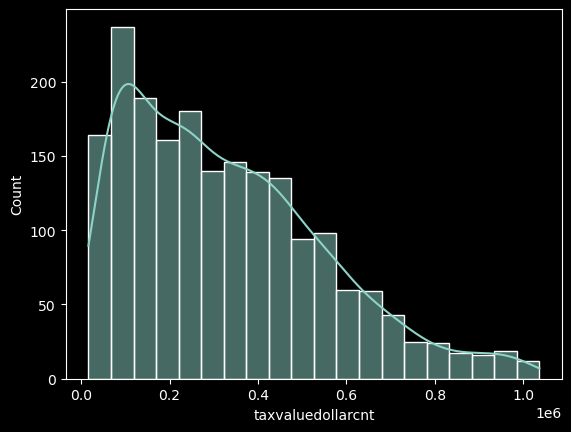

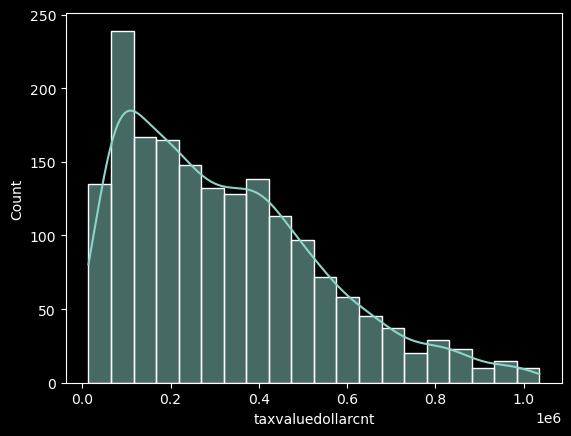

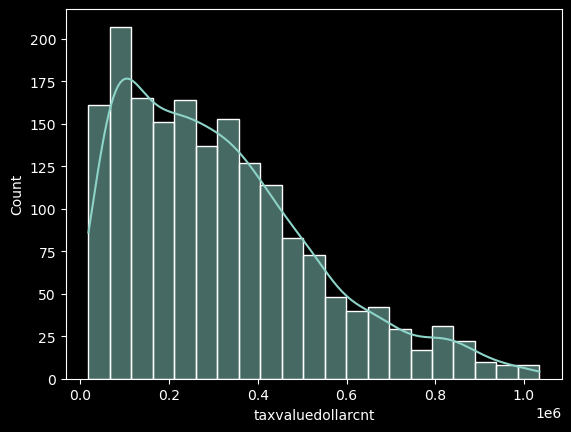

Reject~H_{0}~?

False

In [11]:

topthreesalesvalue_la=train_la[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).sum().nlargest(columns='taxvaluedollarcnt',n=3,keep='all').index.to_list()

topthreesalesvalue_ladf=train_la[(train_la.transaction_month==topthreesalesvalue_la[0]) | (train_la.transaction_month==topthreesalesvalue_la[1]) | (train_la.transaction_month==topthreesalesvalue_la[2]) ]
display(topthreesalesvalue_ladf[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).var().style.format(lambda x:f'{x:.3}').set_caption(caption="Variances:\n Top 3 months(LA)\n by total value"))


train_LAjune=train_la[(train_la.transaction_month==topthreesalesvalue_la[0])]
train_LAmarch=train_la[(train_la.transaction_month==topthreesalesvalue_la[1])]
train_LAmay=train_la[(train_la.transaction_month==topthreesalesvalue_la[2])]

sns.histplot(data=train_LAjune,x='taxvaluedollarcnt',kde=True)
plt.show()


sns.histplot(data=train_LAmarch,x='taxvaluedollarcnt',kde=True)
plt.show()


sns.histplot(data=train_LAmay,x='taxvaluedollarcnt',kde=True)
plt.show()

h,p=stats.kruskal(train_LAjune.taxvaluedollarcnt, train_LAmarch.taxvaluedollarcnt, train_LAmay.taxvaluedollarcnt)


rejnull=symbols('Reject~H_{0}~?')
display(rejnull, p < alpha)


Since we can't reject the null hypothesis, we say that the differences three most profitable months are statistically insignificant. i.e They are the same distributions.



## 4. Do the top three most profitable transaction months for (Orange County) have significant differences?


$ H_0 $ : The top three most profitable transaction months have the same mean.



,taxvaluedollarcnt
transaction_month,
July,6.8e+10
June,7.69e+10
May,7.38e+10


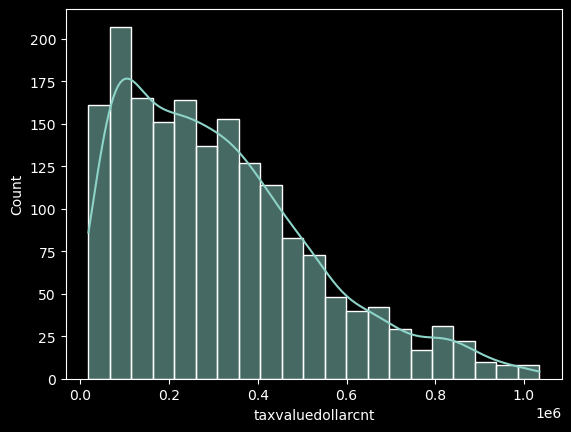

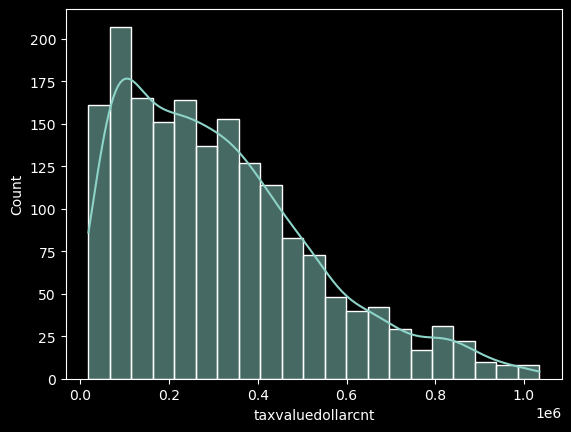

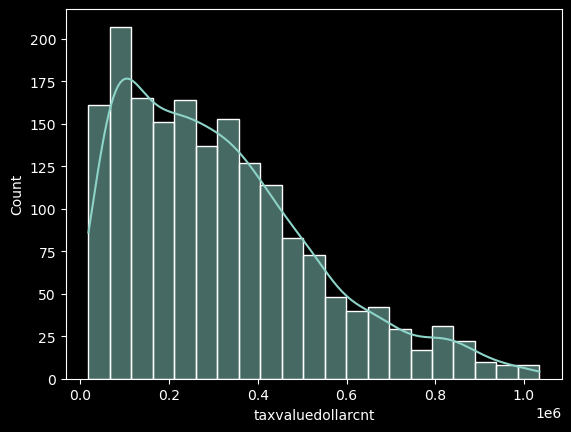

Reject~H_{0}~?

False

In [12]:

topthreesalesvalue_orange=orange_train [['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).sum().nlargest(columns='taxvaluedollarcnt',n=3,keep='all').index.to_list()

topthreesalesvalue_orangedf=orange_train [(orange_train .transaction_month==topthreesalesvalue_orange[0]) | (orange_train .transaction_month==topthreesalesvalue_orange[1]) | (orange_train .transaction_month==topthreesalesvalue_orange[2]) ]
display(topthreesalesvalue_orangedf[['taxvaluedollarcnt','transaction_month']].groupby(by=['transaction_month']).var().style.format(lambda x:f'{x:.3}').set_caption(caption="Variances:\n Top 3 months (OC)\n by total value"))


train_Orange_june=orange_train [(orange_train .transaction_month==topthreesalesvalue_orange[0])]
train_Orange_march=orange_train [(orange_train .transaction_month==topthreesalesvalue_orange[1])]
train_Orange_may=orange_train [(orange_train .transaction_month==topthreesalesvalue_orange[2])]

sns.histplot(data=train_LAmay,x='taxvaluedollarcnt',kde=True)
plt.show()
sns.histplot(data=train_LAmay,x='taxvaluedollarcnt',kde=True)
plt.show()
sns.histplot(data=train_LAmay,x='taxvaluedollarcnt',kde=True)
plt.show()

h,p=stats.kruskal(train_Orange_june.taxvaluedollarcnt, train_Orange_march.taxvaluedollarcnt, train_Orange_may.taxvaluedollarcnt)


rejnull=symbols('Reject~H_{0}~?')
display(rejnull, p < alpha)



Since we can't reject the null hypothesis, we say that the differences three most profitable months are statistically insignificant. i.e They are the same distributions.

# Modeling:

After the split we consider our baseline metrics comparing mean median and mode, we will use Root Mean Square Error(RMSE) as our metric to compare model performance.
 
Note: Root Mean Square Error is an absolute measure of the goodness for the fit with the same units as the data.
 
 
We also create two lists which will eventually be zipped together and create a dataframe to compare the models. The model with the least absolute difference from train to verify will be considered our best model and that model will be the only model we attempt to further optimize via grid search.This optimized model will be the only model we test on.
 
 
The only displayed dataframe is sorted by the lowest absolute difference of RMSE


## Full Dataset Scaled

KBest:
[0, 2, 3, 10]
 
RFE:
[5, 11, 12, 16]
 
SFS:
[1, 2, 6, 14]
 
Combined Set
[0, 1, 2, 3, 5, 6, 10, 11, 12, 14, 16]
 
linear



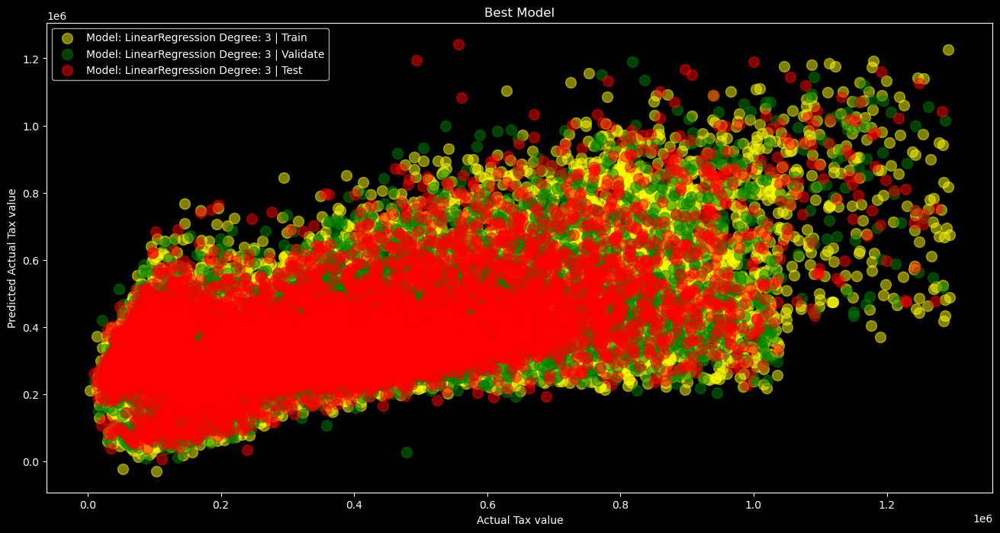

'All'

,Model[RSME],Params,Degree,Train,Validate,abs_percent_change,model_obj
3,LinearRegression degree 3,"{'copy_X': True, 'fit_intercept': True, 'n_job...",3,199116.477189,199166.625603,0.025185,LinearRegression(normalize=True)
2,LinearRegression degree 2,"{'copy_X': True, 'fit_intercept': True, 'n_job...",2,203116.662579,202610.345188,0.249274,LinearRegression(normalize=True)
10,TweedieRegressor,"{'alpha': 0, 'fit_intercept': True, 'link': 'a...",N/A,206387.412359,205368.818775,0.493535,"TweedieRegressor(alpha=0, power=1)"
12,TweedieRegressor,"{'alpha': 0.25, 'fit_intercept': True, 'link':...",N/A,206528.968469,205476.483546,0.509606,"TweedieRegressor(alpha=0.25, power=1.5)"
11,TweedieRegressor,"{'alpha': 0, 'fit_intercept': True, 'link': 'a...",N/A,206672.901749,205477.969657,0.578176,"TweedieRegressor(alpha=0, power=0)"
7,ARDRegression,"{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'compute_...",N/A,206673.346368,205476.899392,0.578907,ARDRegression()
9,BayesianRidge,"{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'alpha_in...",N/A,206673.035212,205474.710918,0.579816,"BayesianRidge(n_iter=10000, tol=1e-08)"
6,LassoLarsIC,"{'copy_X': True, 'criterion': 'aic', 'eps': 2....",N/A,206673.993592,205468.818647,0.583128,LassoLarsIC()
1,LinearRegression degree 1,"{'copy_X': True, 'fit_intercept': True, 'n_job...",1,206673.986453,205465.568676,0.584698,LinearRegression(normalize=True)
8,LassoLars,"{'alpha': 1.0, 'copy_X': True, 'eps': 2.220446...",N/A,206676.824368,205462.450742,0.587571,LassoLars()


Best


,Model[RSME],Params,Degree,Train,Validate,abs_percent_change,model_obj
3,LinearRegression degree 3,"{'copy_X': True, 'fit_intercept': True, 'n_job...",3,199116.477189,199166.625603,0.025185,LinearRegression(normalize=True)


Best w/Test


,model_name,model_params,degree,Train,Validate,Test,Train_to_Val_diff,Train_to_Val_abs_diff,Train_to_Test_diff,Train_to_Test_abs_diff
0,LinearRegression Degree: 3,"{'copy_X': True, 'fit_intercept': True, 'n_job...",3,199116.477189,199166.625603,198965.981507,-50.148414,50.148414,150.495683,150.495683


Our Average RMSE from % Change from baseline
-17.880129198781262


In [13]:

rmseDF_scaled_full,rmseDF_scaled=regmodelbest(X_scaled_train, y_scaled_train, X_scaled_validate, y_scaled_validate, X_scaled_test, y_scaled_test)


## LA County Isolated Dataset Scaled

KBest:
[0, 2, 7, 10]
 
RFE:
[5, 6, 13, 16]
 
SFS:
[2, 6, 7, 14]
 
Combined Set
[0, 2, 5, 6, 7, 10, 13, 14, 16]
 
non linear



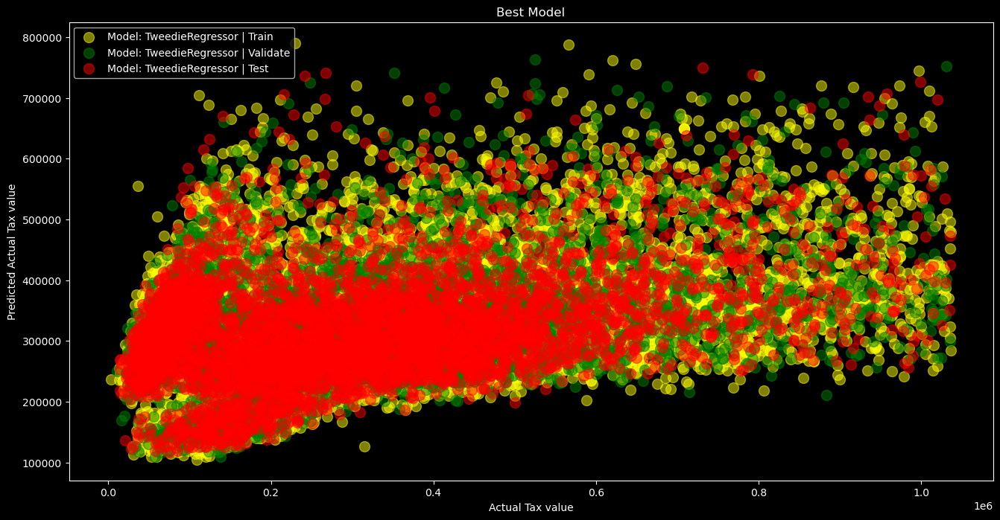

'All'

,Model[RSME],Params,Degree,Train,Validate,abs_percent_change,model_obj
10,TweedieRegressor,"{'alpha': 0, 'fit_intercept': True, 'link': 'a...",N/A,202874.675081,202204.774377,0.330204,"TweedieRegressor(alpha=0, power=1)"
12,TweedieRegressor,"{'alpha': 0.25, 'fit_intercept': True, 'link':...",N/A,202933.246301,202207.523056,0.357617,"TweedieRegressor(alpha=0.25, power=1.5)"
6,LassoLarsIC,"{'copy_X': True, 'criterion': 'aic', 'eps': 2....",N/A,202430.551510,201566.887945,0.426647,LassoLarsIC()
11,TweedieRegressor,"{'alpha': 0, 'fit_intercept': True, 'link': 'a...",N/A,202430.551510,201566.887473,0.426647,"TweedieRegressor(alpha=0, power=0)"
7,ARDRegression,"{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'compute_...",N/A,202438.163257,201572.491048,0.427623,ARDRegression()
1,LinearRegression degree 1,"{'copy_X': True, 'fit_intercept': True, 'n_job...",1,202430.924727,201565.141639,0.427693,LinearRegression(normalize=True)
9,BayesianRidge,"{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'alpha_in...",N/A,202431.011878,201561.263222,0.429652,"BayesianRidge(n_iter=10000, tol=1e-08)"
8,LassoLars,"{'alpha': 1.0, 'copy_X': True, 'eps': 2.220446...",N/A,202431.919522,201557.086435,0.432162,LassoLars()
2,LinearRegression degree 2,"{'copy_X': True, 'fit_intercept': True, 'n_job...",2,198647.086487,199580.372129,0.469821,LinearRegression(normalize=True)
0,Baseline,Mean,N/A,221357.645907,220318.819211,0.469298,N/A


Best


,Model[RSME],Params,Degree,Train,Validate,abs_percent_change,model_obj
10,TweedieRegressor,"{'alpha': 0, 'fit_intercept': True, 'link': 'a...",N/A,202874.675081,202204.774377,0.330204,"TweedieRegressor(alpha=0, power=1)"


Best w/Test


,model_name,model_params,degree,Train,Validate,Test,Train_to_Val_diff,Train_to_Val_abs_diff,Train_to_Test_diff,Train_to_Test_abs_diff
0,TweedieRegressor,"{'alpha': 0, 'fit_intercept': True, 'link': 'a...",N/A,202874.675081,202204.774377,199127.428368,669.900703,669.900703,3747.246713,3747.246713


Our Average RMSE from % Change from baseline
-8.285932928174025


In [14]:


##LA

rmseDF_scaled_la,rmseDF_scaled_la_full=regmodelbest(X_scaled_la_train, y_scaled_la_train, X_scaled_la_validate, y_scaled_la_validate, X_scaled_la_test, y_scaled_la_test)
# display(rmseDF_scaled_la.style.highlight_min(subset='abs_percent_change').format(lambda x:f'{x:.2g}').set_caption(caption="LA Portion of Prepped Dataset Scaled"),laTest.style.format(lambda x:f'{x:.2g}').set_caption(caption="LA Test"))




## Orange County Isolated Dataset Scaled

KBest:
[2, 3, 5, 15]
 
RFE:
[5, 6, 11, 16]
 
SFS:
[2, 3, 10, 13]
 
Combined Set
[2, 3, 5, 6, 10, 11, 13, 15, 16]
 
linear



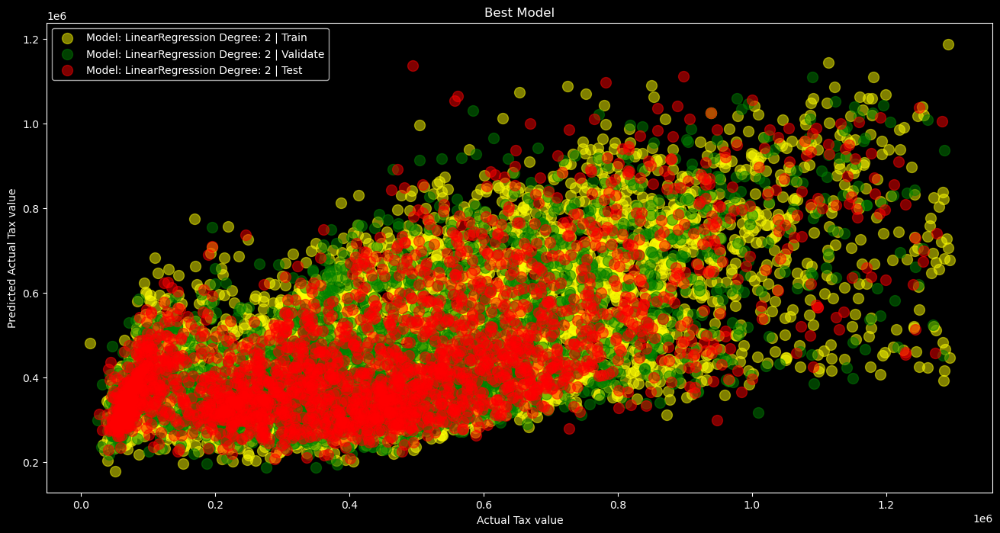

'All'

,Model[RSME],Params,Degree,Train,Validate,abs_percent_change,model_obj
2,LinearRegression degree 2,"{'copy_X': True, 'fit_intercept': True, 'n_job...",2,211343.485712,209837.205402,0.712717,LinearRegression(normalize=True)
1,LinearRegression degree 1,"{'copy_X': True, 'fit_intercept': True, 'n_job...",1,215788.609249,213352.214550,1.129065,LinearRegression(normalize=True)
7,ARDRegression,"{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'compute_...",N/A,216678.396389,214104.496169,1.187890,ARDRegression()
12,TweedieRegressor,"{'alpha': 0.25, 'fit_intercept': True, 'link':...",N/A,214026.213445,211349.200838,1.250787,"TweedieRegressor(alpha=0.25, power=1.5)"
10,TweedieRegressor,"{'alpha': 0, 'fit_intercept': True, 'link': 'a...",N/A,213760.389163,211072.265598,1.257541,"TweedieRegressor(alpha=0, power=1)"
6,LassoLarsIC,"{'copy_X': True, 'criterion': 'aic', 'eps': 2....",N/A,215966.367412,213246.637277,1.259330,LassoLarsIC()
11,TweedieRegressor,"{'alpha': 0, 'fit_intercept': True, 'link': 'a...",N/A,215966.367412,213246.637123,1.259330,"TweedieRegressor(alpha=0, power=0)"
8,LassoLars,"{'alpha': 1.0, 'copy_X': True, 'eps': 2.220446...",N/A,215966.475658,213243.588017,1.260792,LassoLars()
9,BayesianRidge,"{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'alpha_in...",N/A,215967.056707,213236.515701,1.264332,"BayesianRidge(n_iter=10000, tol=1e-08)"
3,LinearRegression degree 3,"{'copy_X': True, 'fit_intercept': True, 'n_job...",3,237745.187339,241699.846307,1.663402,LinearRegression(normalize=True)


Best


,Model[RSME],Params,Degree,Train,Validate,abs_percent_change,model_obj
2,LinearRegression degree 2,"{'copy_X': True, 'fit_intercept': True, 'n_job...",2,211343.485712,209837.205402,0.712717,LinearRegression(normalize=True)


Best w/Test


,model_name,model_params,degree,Train,Validate,Test,Train_to_Val_diff,Train_to_Val_abs_diff,Train_to_Test_diff,Train_to_Test_abs_diff
0,LinearRegression Degree: 2,"{'copy_X': True, 'fit_intercept': True, 'n_job...",2,211343.485712,209837.205402,215773.862114,1506.28031,1506.28031,-4430.376402,4430.376402


Our Average RMSE from % Change from baseline
-21.052968131119158


In [15]:
##Orange

rmseDF_scaled_orange,rmseDF_scaled_orange_full=regmodelbest(X_scaled_orange_train,y_scaled_orange_train,X_scaled_orange_validate,y_scaled_orange_validate,X_scaled_orange_test,y_scaled_orange_test)

# display(rmseDF_scaled_orange.style.highlight_min(subset='abs_percent_change').format(lambda x:f'{x:.2g}').set_caption(caption="Orange County Portion of Prepped Dataset Scaled"),otest.style.format(lambda x:f'{x:.2g}').set_caption(caption="Orange County Test"))





Note: all the RSME's are the same order of magnitude $x \cdot 10^5$ We also had several models that beat our respective baseline metrics. This is good if we wish to optimize further in the future. Also we see that the Elastic Net model performed well in each iteration.


# Executive Summary/ Conclusion:


Findings:
Our data all comes from LA, Orange or Ventura county in California.
Used FIPS to find the county’s and states.
 
 
 
Our selected top models all beat baseline perfomance ranging from an 8 to 21% reduction in RSME. It is worth further exploring and optimizing hyperparameters. We also see differences in the partitioned data. There are other model selection criteria we could have used. As such it would be worth investigating Mean Absolute Error(MAE) and $ R^2 $ as model selection criteria in subsequent explorations. 


#### Closing Quote:
>
>“Errors using inadequate data are much less than those using no data at all.”
(Charles Babbage, English Mathematician)
